# Linear regression
## Name: Nguyen Anh Hoang Phuc

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn import datasets

In [2]:
class ScratchLinearRegression():
    """
    Scratch implementation of linear regression
    
    Parameters
    ----------
    num_iter : int
      Number of iterations
    lr : float
      Learning rate
    no_bias : bool
      True if no bias term is included
    verbose : bool
      True to output the learning process
    
    Attributes
    ----------
    self.coef_ : The following form of ndarray, shape (n_features,)
      Parameters
    self.loss : The following form of ndarray, shape (self.iter,)
      Record losses on training data
    self.val_loss : The following form of ndarray, shape (self.iter,)
      Record loss on validation data
    """
    
    def __init__(self, num_iter=1000, lr=0.01, no_bias=False, verbose=False):
        # Record hyperparameters as attributes
        self.iter = num_iter
        self.lr = lr
        self.no_bias = no_bias
        self.verbose = verbose
        # Prepare an array to record the loss
        self.loss = np.zeros(self.iter)
        self.val_loss = np.zeros(self.iter)
    
    # Problem 1 Hypothetical function
    def _linear_hypothesis(self, X):
        """
        Compute a linear hypothetical function
        Parameters
        ----------
        X : The following forms of ndarray, shape (n_samples, n_features)
        Training data
        Returns
        -------
        The following form of ndarray, shape (n_samples, 1)
        Estimated result by linear hypothetical function
        """
        x1 = X

        # x0 Create a bias term.
        if self.no_bias:
            x0 = np.zeros(x1.shape[0])
        else:
            x0 = np.ones(x1.shape[0])
        return np.concatenate([x0.reshape(-1,1),x1],axis=1)

    # Problem 2 Steepest descent
    def _gradient_descent(self, X, error):
        """
        Write a description
        """
        self.theta = self.theta - self.lr*np.dot(error,X)/len(X)
        
    def fit(self, X, y, X_val=False, y_val=False):
        """
        Learn linear regression. If validation data is entered, the loss and accuracy for it are also calculated for each iteration.
        Parameters
        ----------
        X : The following forms of ndarray, shape (n_samples, n_features)
            Features of training data
        y : The following form of ndarray, shape (n_samples,)
            Correct answer value of training data
        X_val : The following forms of ndarray, shape (n_samples, n_features)
            Features of verification data
        y_val : The following form of ndarray, shape (n_samples,)
            Correct value of verification data
        """
        x1 = self._linear_hypothesis(X)

        # Give the initial value of parameter 0 as a random number
        self.theta = np.random.random(x1.shape[1])

        for i in range(self.iter):

            # Compute predictions with hypothetical functions
            y1 = np.dot(x1, self.theta)

            # Calculate the error between the true value and the predicted value
            error = y1 - y 
            self.loss[i] += np.mean(error**2)/2

            # If X_valid is entered, it will be read as x2 
            if (type(X_val) != bool):
                x2 = self._linear_hypothesis(X_val)
                y2 = np.dot(x2, self.theta)
                error_val = y2 - y_val
                self.val_loss[i] += np.mean(error_val**2)/2
            
            # Optimize the parameter theta by the steepest descent method
            self._gradient_descent(x1, error)
        
            if self.verbose:
                #Output learning process when verbose is set to True
                print('n_iter: ',i,', ',
                      'loss: ', self.loss[i],', ',
                      'theta: ', self.theta)
        
    # Problem 3 Estimated
    def predict(self, X):
        """
        Estimate using linear regression.
        Parameters
        ----------
        X : The following forms of ndarray, shape (n_samples, n_features)
            sample
        Returns
        -------
            The following form of ndarray, shape (n_samples, 1)
            Estimated result by linear regression
        """
        return np.dot(self._linear_hypothesis(X), self.theta)

## Problem 1 Hypothetical function

Implement the linear regression hypothetical function represented by the following formula. I have prepared a method template

h​ ​θ​ ​(​ ​x​ ​)​ ​=​ ​θ​ ​0​ ​x​ ​0​ ​+​ ​θ​ ​1​ ​x​ ​1​ ​+​ ​.​ ​.​ ​.​ ​+​ ​θ​ ​j​ ​x​ ​j​ ​+​ ​.​ ​.​ ​.​ ​+​ ​θ​ ​n​ ​x​ ​n​ ​.​ ​(​ ​x​ ​0​ ​=​ ​1​ ​)

$x$: Feature vector

$\theta$: parameter vector

$n$: Number of features

$x_j$: jth feature

$\theta_j$: jth parameter (weight)

特徴量の数$n$は任意の値に対応できる実装にしてください。

The vector format is as follows.

h​ ​θ​ ​(​ ​x​ ​)​ ​=​ ​θ​ ​T​ ​⋅​ ​x​ ​.

Prototype

Since it is a method that is never called from outside the class, it is customary in Python to prefix it with an underscore.

In [3]:
# Test outside the function
x1 = np.array([0,1,2,3,4,5,6,7,8,9])
x0 = np.ones(x1.shape[0])

X = np.concatenate([x0.reshape(-1,1), x1.reshape(-1,1)],axis=1)
theta = np.random.random(X.shape[1])

In [4]:
X.shape

(10, 2)

In [5]:
theta

array([0.90852207, 0.94801348])

In [6]:
np.dot(X, theta)

array([0.90852207, 1.85653554, 2.80454902, 3.75256249, 4.70057597,
       5.64858945, 6.59660292, 7.5446164 , 8.49262988, 9.44064335])

## Problem 2 Steepest descent
Implement the steepest descent method for training. Add a method _gradient_descent that updates the parameters as in the following equation, and
Please it call from the fit method.

θ​ ​j​ ​: =​ ​θ​ ​j​ ​−​ ​α​ ​1​ ​m​ ​m​ ​∑​ ​i​ ​=​ ​1​ ​[​ ​(​ ​h​ ​θ​ ​(​ ​x​ ​(​ ​i​ ​)​ ​)​ ​−​ ​y​ ​(​ ​i​ ​)​ ​)​ ​x​ ​(​ ​i​ ​)​ ​j​ ​]

$\alpha$: learning rate

$i$: sample index

$j$: Feature index

Prototype

Add the following method to the ScratchLinearRegression class. Please also describe the commented out part.

In [7]:
# Calculate only once outside the function
x1 = np.array([0,1,2,3,4,5,6,7,8])
y = np.array([2,4,2,1,6,7,8,5,2])

x0 = np.ones(x1.shape[0])
X = np.concatenate([x0.reshape(-1,1),x1.reshape(-1,1)],axis=1)
theta = np.random.random(2)

y1 = np.dot(X,theta)

alpha = 0.01 

error = (y1 - y)
theta[0] = theta[0] - alpha*np.mean(error)
theta[1] = theta[1] - alpha*np.mean(error*x1)

In [8]:
np.mean(error)

-1.5803774005440814

In [9]:
np.mean(error*x1)

-5.943974239526079

In [10]:
# Try to do theta calculation in one line
np.dot(error, X)

array([-14.2233966 , -53.49576816])

In [11]:
# Try to update theta once.
x1 = np.array([0,1,2,3,4,5,6,7,8])
y = np.array([2,4,2,1,6,7,8,5,2])

x0 = np.ones(x1.shape[0])
X = np.concatenate([x0.reshape(-1,1),x1.reshape(-1,1)],axis=1)
theta = np.random.random(2)

y1 = np.dot(X,theta)

alpha = 0.01 

error = (y1 - y)

theta = theta - alpha*np.dot(error,X)/len(X)
print(theta)

[0.87486664 0.52163737]


In [12]:
X.shape 

(9, 2)

In [13]:
y1.shape

(9,)

In [14]:
y1.reshape(-1,1)

array([[0.86142058],
       [1.3376918 ],
       [1.81396303],
       [2.29023425],
       [2.76650547],
       [3.24277669],
       [3.71904791],
       [4.19531913],
       [4.67159036]])

In [15]:
y.shape

(9,)

In [16]:
error.reshape(-1,1)

array([[-1.13857942],
       [-2.6623082 ],
       [-0.18603697],
       [ 1.29023425],
       [-3.23349453],
       [-3.75722331],
       [-4.28095209],
       [-0.80468087],
       [ 2.67159036]])

In [17]:
theta

array([0.87486664, 0.52163737])

## Problem 3 Estimation
Please implement the estimation mechanism. Add it to the predict method included in the template of the ScratchLinearRegression class.

The output of the hypothetical function $h_\theta(x)$ is the estimation result.

In [18]:
def scratch_train_test_split(X, y, train_size=0.8):
    """Divide the validation data.
    Parameters
    ----------
    X : ndarray
      Training data (n_samples, n_features)
    y : ndarray
      Correct answer value (n_samples,)
    train_size : float
      Specify what percentage to use as a train (0 < train_size < 1)
    Returns
    -------
    X_train : ndarray
      Training data (n_samples, n_features)
    X_test : ndarray
      Validation data (n_samples, n_features)
    y_train : ndarray
      Correct answer value of training data (n_samples,)
    y_test : ndarray
      Correct value of verification data (n_samples,)
    """
    # Write code here
    if train_size<=0 or train_size >= 1:
         raise ValueError('train_size={0} should be a float in the '
                         '(0, 1) range'.format(train_size))
    train_size = int(train_size*X.shape[0])
    idx = np.arange(X.shape[0])
    np.random.shuffle(idx)
    X = X[idx]
    y = y[idx]
    split = np.split(X, [train_size])
    X_train = split[0]
    X_test = split[1]
    split = np.split(y, [train_size])
    y_train = split[0]
    y_test = split[1]
    return X_train, X_test, y_train, y_test

In [19]:
boston = datasets.load_boston()
X = boston.data[:, [5]]
y = boston.target

In [20]:
print('X.shape ', X.shape)
print('y.shape ', y.shape)

X.shape  (506, 1)
y.shape  (506,)


In [21]:
X_train, X_test, y_train, y_test = scratch_train_test_split(X,y,train_size=0.7)

In [22]:
reg = ScratchLinearRegression(num_iter=50000, lr=0.0001)

reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)

[]

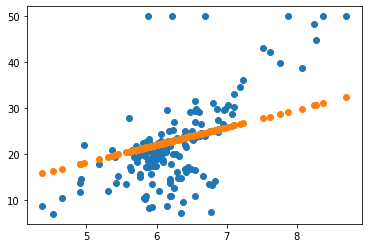

In [23]:
plt.scatter(X_test, y_test)
plt.scatter(X_test, y_pred)
plt.plot()

## Problem 4 Mean squared error
Create a function of mean square error (MSE) used as an index value for linear regression.

Since the mean square error function is a function that can be used for regression problems in general, create it as a separate function instead of the method of the ScratchLinearRegression class. We have a template.

The mean square error is expressed by the following formula.

L​ ​(​ ​θ​ ​)​ ​=​ ​1​ ​m​ ​m​ ​∑​ ​i​ ​=​ ​1​ ​(​ ​h​ ​θ​ ​(​ ​x​ ​(​ ​i​ ​)​ ​)​ ​−​ ​y​ ​(​ ​i​ ​)​ ​)​ ​2​ ​.

$m$: Number of input data

$h_\theta()$: Assumption function

$x^{(i)}$: Feature vector of the i-th sample

$y^{(i)}$: Correct value of i-th sample

As the objective function (loss function) for the steepest descent method, divide this by 2 and use it. (Problems 5, 9)

In [24]:
def MSE(y_pred, y):
    """
    Calculation of mean square error
    Parameters
    ----------
    y_pred : 次の形のndarray, shape (n_samples,)
      Estimated value
    y : 次の形のndarray, shape (n_samples,)
      Correct answer value
    Returns
    ----------
    mse : numpy.float
      Mean squared error
    """
    mse = np.mean((y_pred-y)**2)
    return mse

In [25]:
y_test = np.array([2,4,2,1,6])
y_pred = np.array([1,4,3,5,2])

In [26]:
mse = MSE(y_pred, y_test)
mse

6.8

In [27]:
# Check if the calculations results are correct.
from sklearn.metrics import mean_squared_error

y_test = np.array([2,4,2,1,6])
y_pred = np.array([1,4,3,5,2])
mean_squared_error(y_test, y_pred)

6.8

## Problem 5 Objective function
Implement the objective function (loss function) of linear regression represented by the following formula and be sure to record this inself.loss,self.val_loss.

The objective function (loss function) $J(\theta)$ is the following formula.

J​ ​(​ ​θ​ ​)​ ​=​ ​1​ ​2​ ​m​ ​m​ ​∑​ ​i​ ​=​ ​1​ ​(​ ​h​ ​θ​ ​(​ ​x​ ​(​ ​i​ ​)​ ​)​ ​−​ ​y​ ​(​ ​i​ ​)​ ​)​ ​2​ ​.

$m$: Number of input data

$h_\theta()$: Assumption function

$x^{(i)}$: Feature vector of the i-th sample

$y^{(i)}$: Correct value of i-th sample

In [28]:
print(reg.loss.shape)
reg.loss.reshape(-1,1)

(50000,)


array([[205.49462264],
       [204.04080822],
       [202.59895162],
       ...,
       [ 27.85198261],
       [ 27.85196577],
       [ 27.85194894]])

In [29]:
print(reg.val_loss.shape)
reg.val_loss.reshape(-1,1)

(50000,)


array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

## Problem 6 Learning and estimation
Learn and estimate scratch implementations from the House Prices competition data provided in Sprint, an introduction to machine learning scratch.

Compare this with the scikit-learn implementation and see if it works correctly.

In [30]:
# Load the train data of House Prices
train = pd.read_csv('train.csv')
print('shape: ', train.shape)
train.head()

shape:  (1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [31]:
X = train[['YearBuilt']].values
y = train[['SalePrice']].values 
y = y.reshape(-1)
print('X.shape: ', X.shape)
print('y.shape: ', y.shape)

X.shape:  (1460, 1)
y.shape:  (1460,)


In [32]:
X_train, X_valid, y_train, y_valid = scratch_train_test_split(X,y,train_size=0.8)
print('X_train.shape: ', X_train.shape)
print('X_valid.shape: ', X_valid.shape)
print('y_train.shape: ', y_train.shape)
print('y_valid.shape: ', y_valid.shape)

X_train.shape:  (1168, 1)
X_valid.shape:  (292, 1)
y_train.shape:  (1168,)
y_valid.shape:  (292,)


In [33]:
# standardization
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_valid_std = scaler.transform(X_valid)

In [34]:
reg1 = ScratchLinearRegression(num_iter=10000, lr=0.0001)

reg1.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred1 = reg1.predict(X_valid_std)

[]

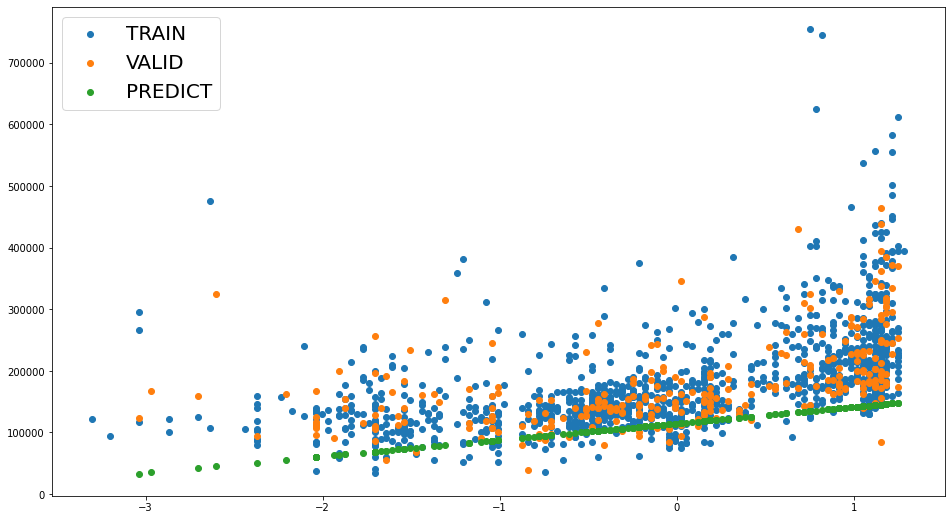

In [35]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std, y_train, label="TRAIN")
plt.scatter(X_valid_std, y_valid, label="VALID")
plt.scatter(X_valid_std, y_pred1, label="PREDICT")
plt.legend()
plt.plot()

In [36]:
# mean squared error
mse = MSE(y_pred1, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 8084803158.3
RMS: 89915.5


In [37]:
from sklearn.linear_model import LinearRegression

reg2 = LinearRegression()

reg2.fit(X_train_std, y_train) 
y_pred_sklearn = reg2.predict(X_valid_std)

[]

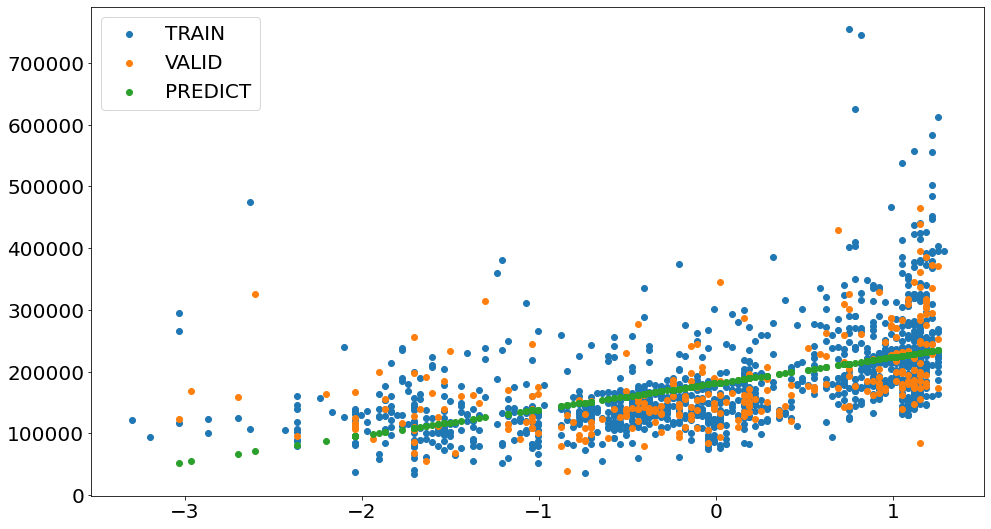

In [38]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std, y_train, label="TRAIN")
plt.scatter(X_valid_std, y_valid, label="VALID")
plt.scatter(X_valid_std, y_pred_sklearn, label="PREDICT")
plt.legend()
plt.plot()

In [39]:
# mean squared error
mse = MSE(y_pred_sklearn, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 3682224530.4
RMS: 60681.3


## Problem 7 Learning curve plot
Create and execute a function that displays the learning curve. Look at the graph to see if the loss is down properly.

In the template of the linear regression class, the loss is recorded in self.loss and self.val_loss, so please use this for input.

[]

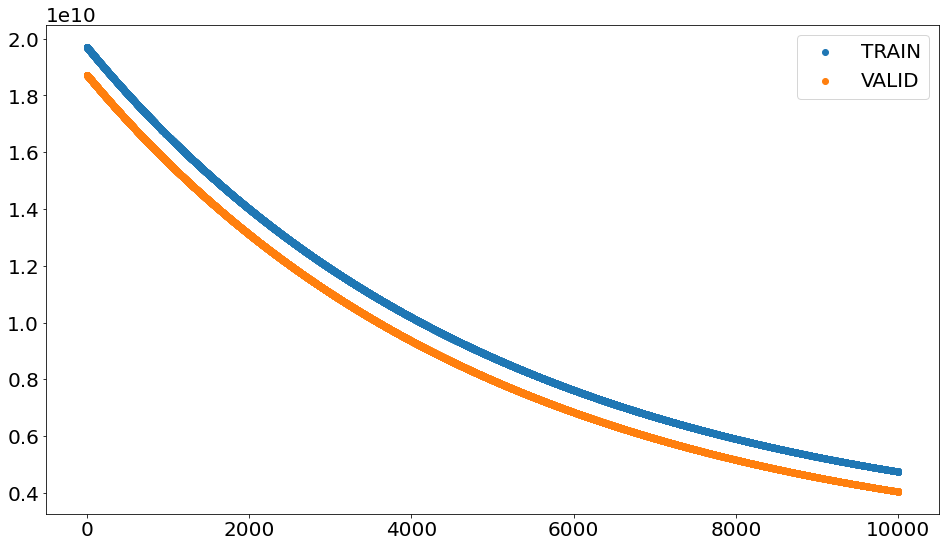

In [40]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg1.loss)), reg1.loss, label="TRAIN")
plt.scatter(range(len(reg1.val_loss)), reg1.val_loss, label="VALID")
plt.legend()
plt.plot()

<li> Try to repredict with different learning rates (lr=0.01)

In [41]:
reg3 = ScratchLinearRegression(num_iter=5000, lr=0.01)

reg3.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred3 = reg3.predict(X_valid_std)

[]

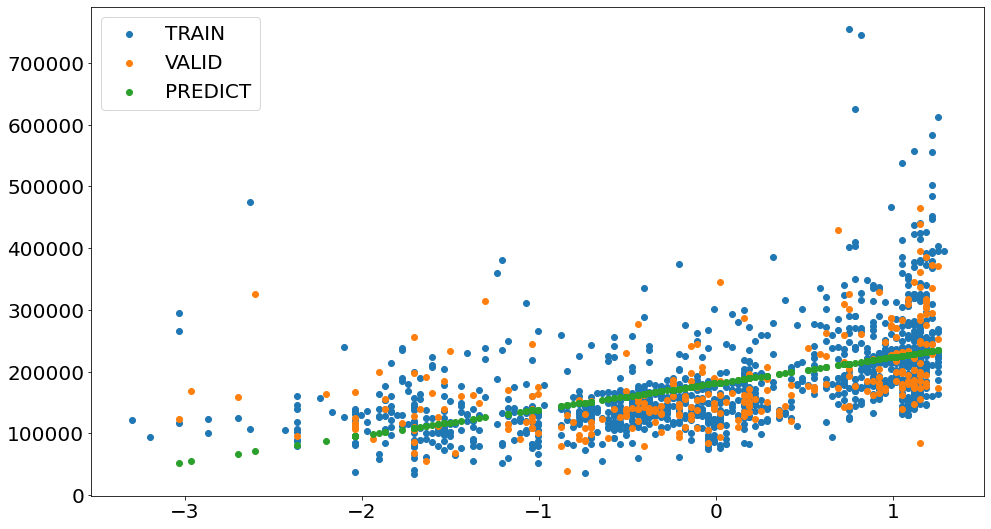

In [42]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std, y_train, label="TRAIN")
plt.scatter(X_valid_std, y_valid, label="VALID")
plt.scatter(X_valid_std, y_pred3, label="PREDICT")
plt.legend()
plt.plot()

[]

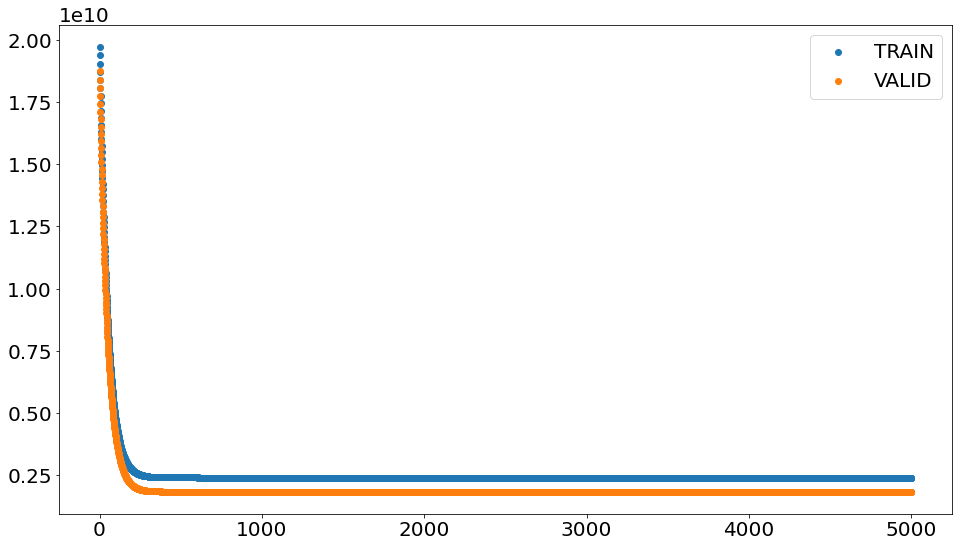

In [43]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg3.loss)), reg3.loss, label="TRAIN")
plt.scatter(range(len(reg3.val_loss)), reg3.val_loss, label="VALID")
plt.legend()
plt.plot()

<li> When I ran the calculation with a learning rate of 0.01, the answer was the same as sklearn's linear regression (default value)

## Problem 8 (Advance task) Removal of bias term
Verify how learning changes when the bias term $\theta_0$ is removed. Also, consider and investigate the role of bias terms in linear regression models.

In [44]:
reg4 = ScratchLinearRegression(num_iter=10000, lr=0.001, no_bias=True)

reg4.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred4 = reg4.predict(X_valid_std)

[]

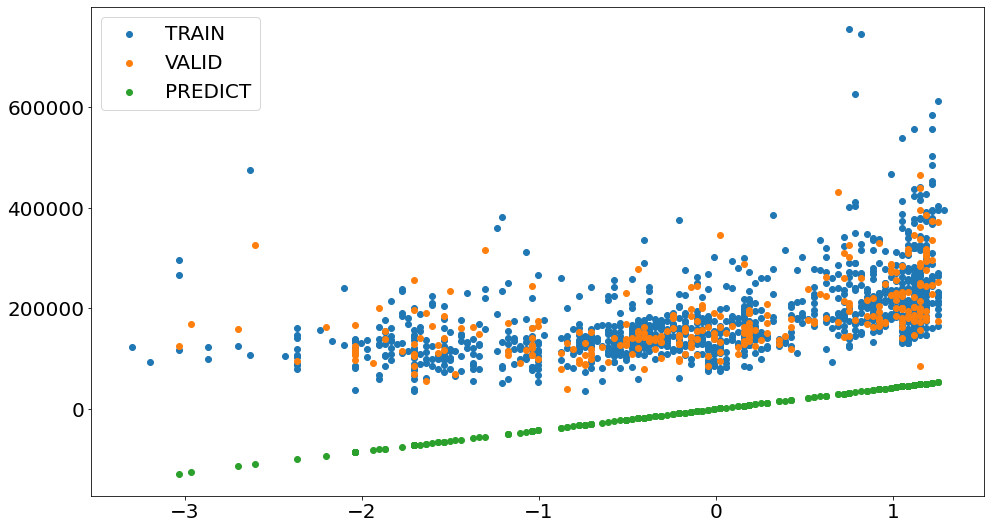

In [45]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std, y_train, label="TRAIN")
plt.scatter(X_valid_std, y_valid, label="VALID")
plt.scatter(X_valid_std, y_pred4, label="PREDICT")
plt.legend()
plt.plot()

[]

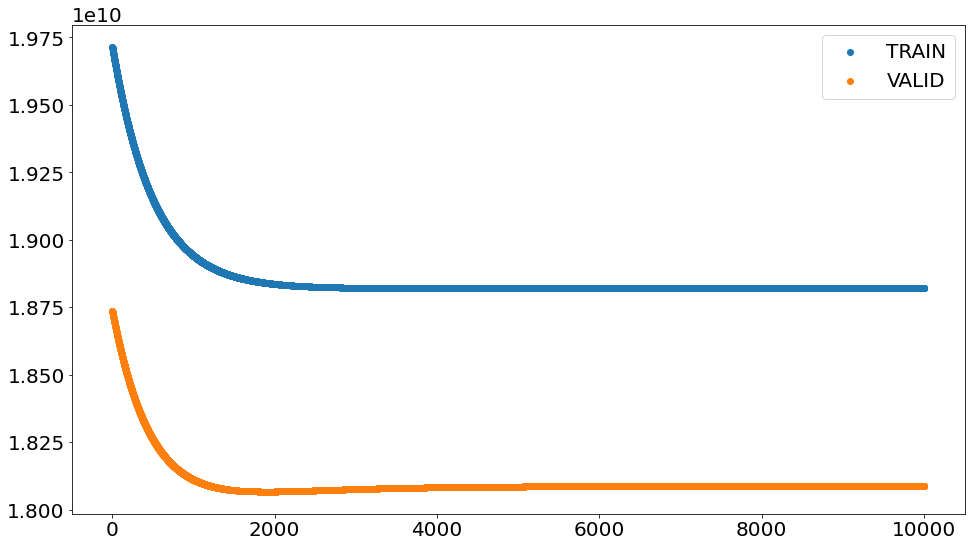

In [46]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg4.loss)), reg4.loss, label="TRAIN")
plt.scatter(range(len(reg4.val_loss)), reg4.val_loss, label="VALID")
plt.legend()
plt.plot()

<li> When the bias term is removed, the regression line passes through the origin (0,0), and the error in the predicted value becomes larger than when the bias term is present.
<li> The learning curve also shows a different curve between the training data and the validation data, confirming that it is not learning well.
<li> The role of the bias term: Necessary to minimize the error between the true value and the predicted value (error can be reduced).

## Problem 9 (Advance task) Multidimensional feature quantity
Please verify how the learning result changes when the square or cube of the feature is used for input.

In [47]:
X = train[['YearBuilt','YearBuilt']].values
y = train[['SalePrice']].values 
y = y.reshape(-1)
print('X.shape: ', X.shape)
print('y.shape: ', y.shape)

X.shape:  (1460, 2)
y.shape:  (1460,)


In [48]:
# Adding a square to a feature 
X[:,1] = X[:,1]**2
X

array([[   2003, 4012009],
       [   1976, 3904576],
       [   2001, 4004001],
       ...,
       [   1941, 3767481],
       [   1950, 3802500],
       [   1965, 3861225]])

In [49]:
X_train, X_valid, y_train, y_valid = scratch_train_test_split(X,y,train_size=0.8)
print('X_train.shape: ', X_train.shape)
print('X_valid.shape: ', X_valid.shape)
print('y_train.shape: ', y_train.shape)
print('y_valid.shape: ', y_valid.shape)

X_train.shape:  (1168, 2)
X_valid.shape:  (292, 2)
y_train.shape:  (1168,)
y_valid.shape:  (292,)


In [50]:
# standardization
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_valid_std = scaler.transform(X_valid)

In [51]:
reg5 = ScratchLinearRegression(num_iter=5000, lr=0.01)

reg5.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred5 = reg5.predict(X_valid_std)

[]

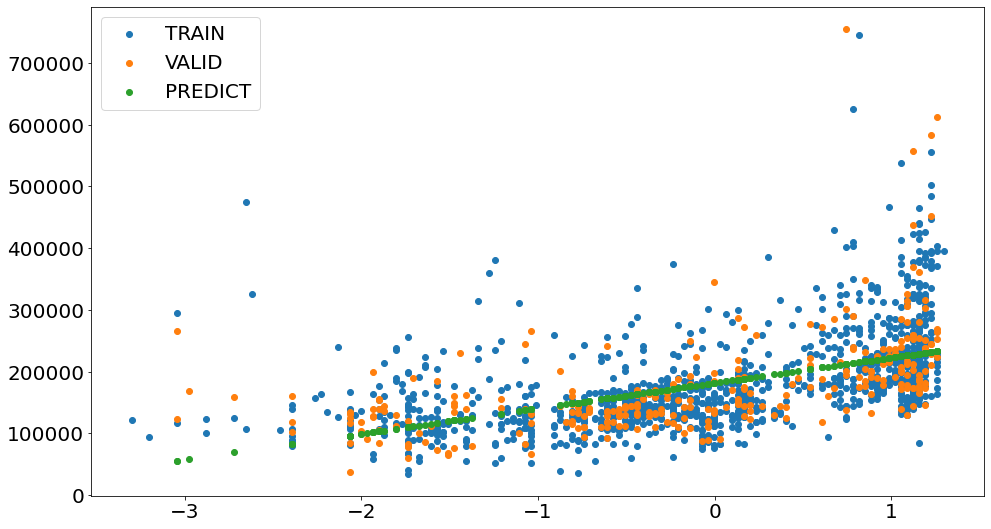

In [52]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std[:,1], y_train, label="TRAIN")
plt.scatter(X_valid_std[:,1], y_valid, label="VALID")
plt.scatter(X_valid_std[:,1], y_pred5, label="PREDICT")
plt.legend()
plt.plot()

In [53]:
# mean squared error
mse = MSE(y_pred5, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 4984359571.9
RMS: 70600.0


[]

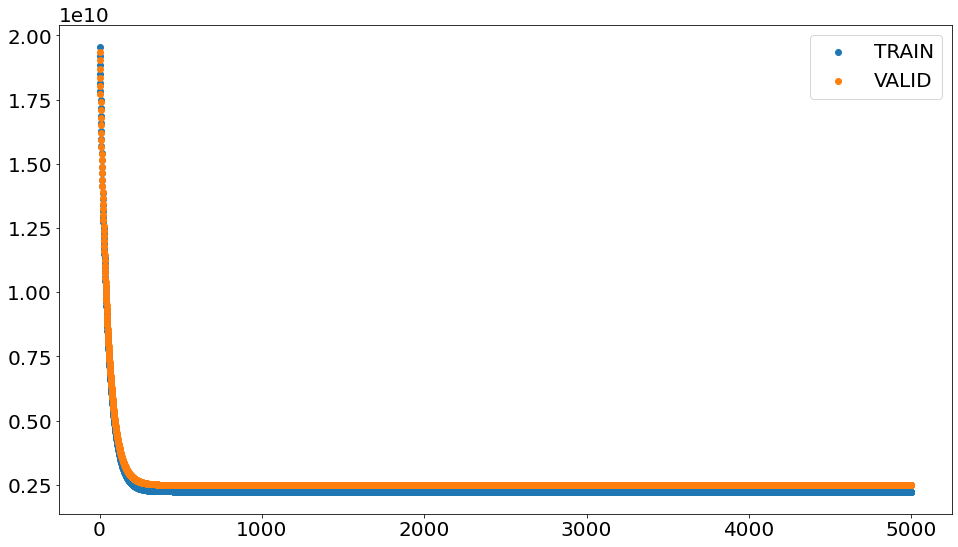

In [54]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg5.loss)), reg5.loss, label="TRAIN")
plt.scatter(range(len(reg5.val_loss)), reg5.val_loss, label="VALID")
plt.legend()
plt.plot()

In [55]:
X = train[['YearBuilt','YearBuilt','YearBuilt']].values
y = train[['SalePrice']].values 
y = y.reshape(-1)
print('X.shape: ', X.shape)
print('y.shape: ', y.shape)
# Adding a square to a feature 
X[:,1] = X[:,1]**2
X[:,2] = X[:,2]**3
X

X.shape:  (1460, 3)
y.shape:  (1460,)


array([[      2003,    4012009, 8036054027],
       [      1976,    3904576, 7715442176],
       [      2001,    4004001, 8012006001],
       ...,
       [      1941,    3767481, 7312680621],
       [      1950,    3802500, 7414875000],
       [      1965,    3861225, 7587307125]])

In [56]:
X_train, X_valid, y_train, y_valid = scratch_train_test_split(X,y,train_size=0.8)
print('X_train.shape: ', X_train.shape)
print('X_valid.shape: ', X_valid.shape)
print('y_train.shape: ', y_train.shape)
print('y_valid.shape: ', y_valid.shape)

X_train.shape:  (1168, 3)
X_valid.shape:  (292, 3)
y_train.shape:  (1168,)
y_valid.shape:  (292,)


In [57]:
# standardization
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_valid_std = scaler.transform(X_valid)

In [58]:
reg6 = ScratchLinearRegression(num_iter=5000, lr=0.01)

reg6.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred6 = reg6.predict(X_valid_std)

[]

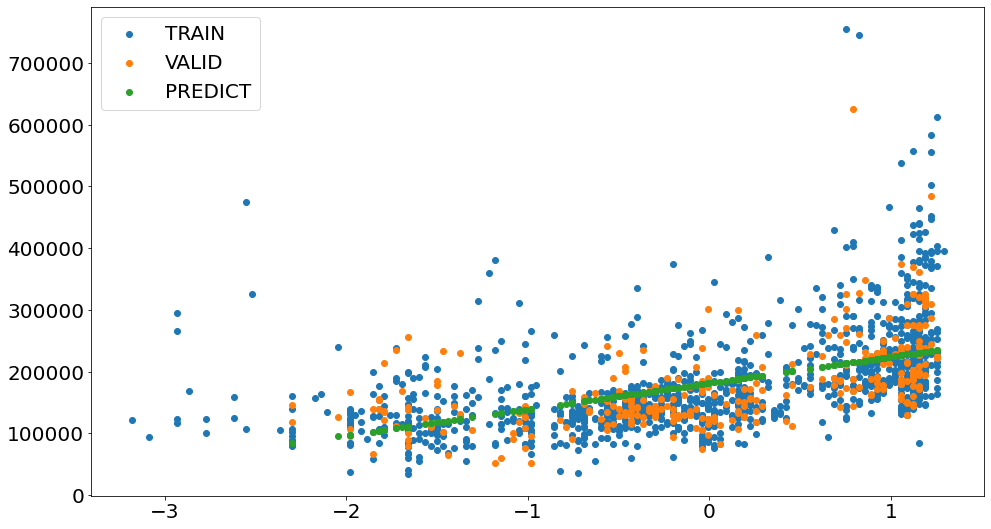

In [59]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std[:,1], y_train, label="TRAIN")
plt.scatter(X_valid_std[:,1], y_valid, label="VALID")
plt.scatter(X_valid_std[:,1], y_pred6, label="PREDICT")
plt.legend()
plt.plot()

In [60]:
# mean squared error
mse = MSE(y_pred6, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 3337293106.1
RMS: 57769.3


[]

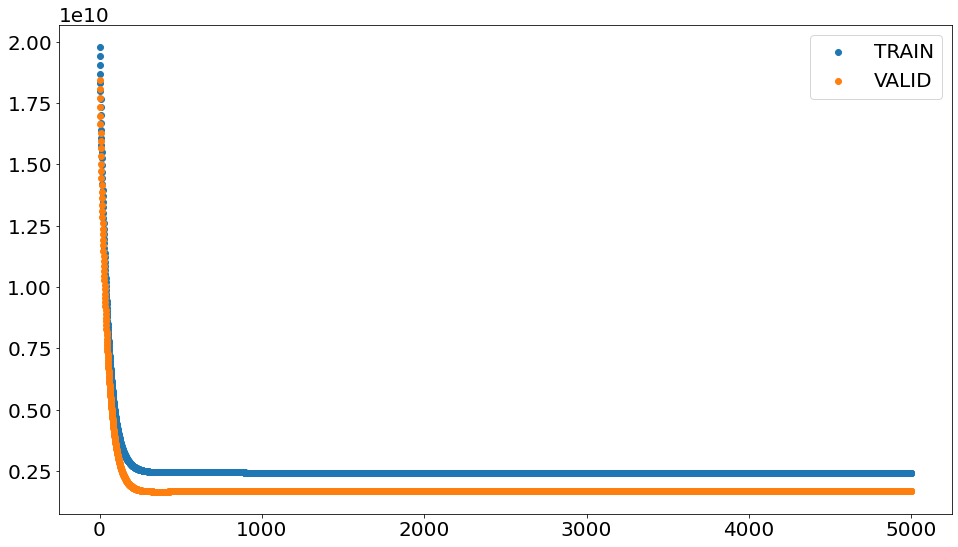

In [61]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg6.loss)), reg6.loss, label="TRAIN")
plt.scatter(range(len(reg6.val_loss)), reg6.val_loss, label="VALID")
plt.legend()
plt.plot()

<li> A slight improvement in the evaluation index can be observed by adding the second and third power.
<li> As before, the predicted values are distributed in a linear fashion. 

Increase and verify the number of features

In [62]:
X = train[['GrLivArea','YearBuilt']].values
y = train[['SalePrice']].values 
y = y.reshape(-1)
print('X.shape: ', X.shape)
print('y.shape: ', y.shape)

X.shape:  (1460, 2)
y.shape:  (1460,)


In [63]:
X_train, X_valid, y_train, y_valid = scratch_train_test_split(X,y,train_size=0.8)
print('X_train.shape: ', X_train.shape)
print('X_valid.shape: ', X_valid.shape)
print('y_train.shape: ', y_train.shape)
print('y_valid.shape: ', y_valid.shape)

X_train.shape:  (1168, 2)
X_valid.shape:  (292, 2)
y_train.shape:  (1168,)
y_valid.shape:  (292,)


In [64]:
# standardization
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_valid_std = scaler.transform(X_valid)

In [65]:
reg7 = ScratchLinearRegression(num_iter=10000, lr=0.01)

reg7.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred7 = reg7.predict(X_valid_std)

[]

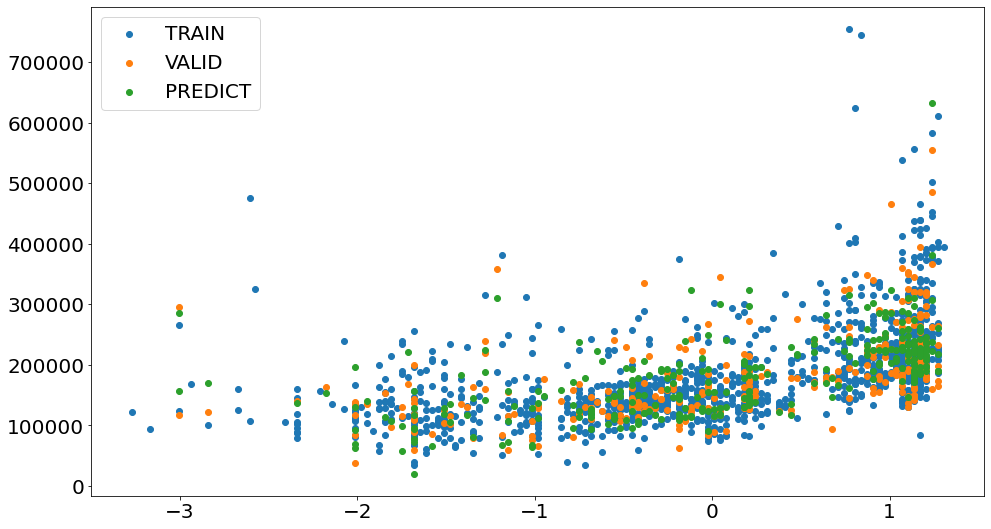

In [66]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std[:,1], y_train, label="TRAIN")
plt.scatter(X_valid_std[:,1], y_valid, label="VALID")
plt.scatter(X_valid_std[:,1], y_pred7, label="PREDICT")
plt.legend()
plt.plot()

In [67]:
# mean squared error
mse = MSE(y_pred6, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 7768065652.4
RMS: 88136.6


[]

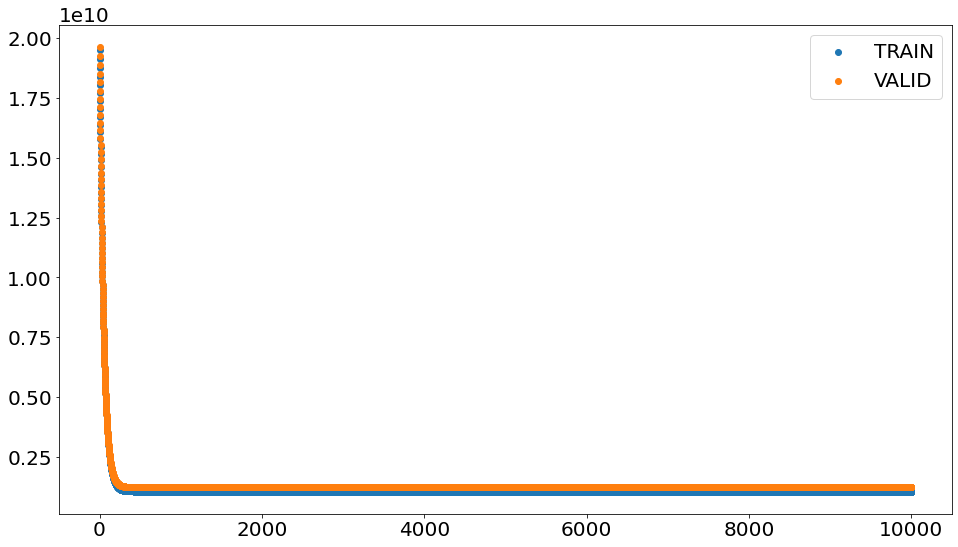

In [68]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg7.loss)), reg7.loss, label="TRAIN")
plt.scatter(range(len(reg7.val_loss)), reg7.val_loss, label="VALID")
plt.legend()
plt.plot()

In [69]:
reg8 = ScratchLinearRegression(num_iter=5000, lr=0.01)

reg8.fit(X_train_std, y_train, X_valid_std, y_valid) 
y_pred8 = reg8.predict(X_valid_std)

[]

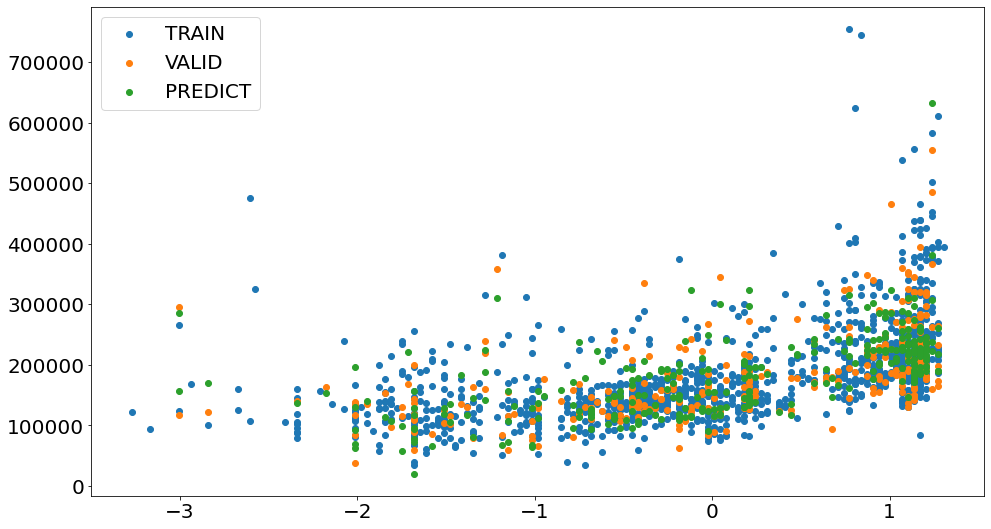

In [70]:
# Visualization of training, validation, and prediction data
fig,ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(X_train_std[:,1], y_train, label="TRAIN")
plt.scatter(X_valid_std[:,1], y_valid, label="VALID")
plt.scatter(X_valid_std[:,1], y_pred8, label="PREDICT")
plt.legend()
plt.plot()

In [71]:
# mean squared error
mse = MSE(y_pred6, y_valid)
print("MSE: {:.1f}".format(mse))
print("RMS: {:.1f}".format(np.sqrt(mse)))

MSE: 7768065652.4
RMS: 88136.6


[]

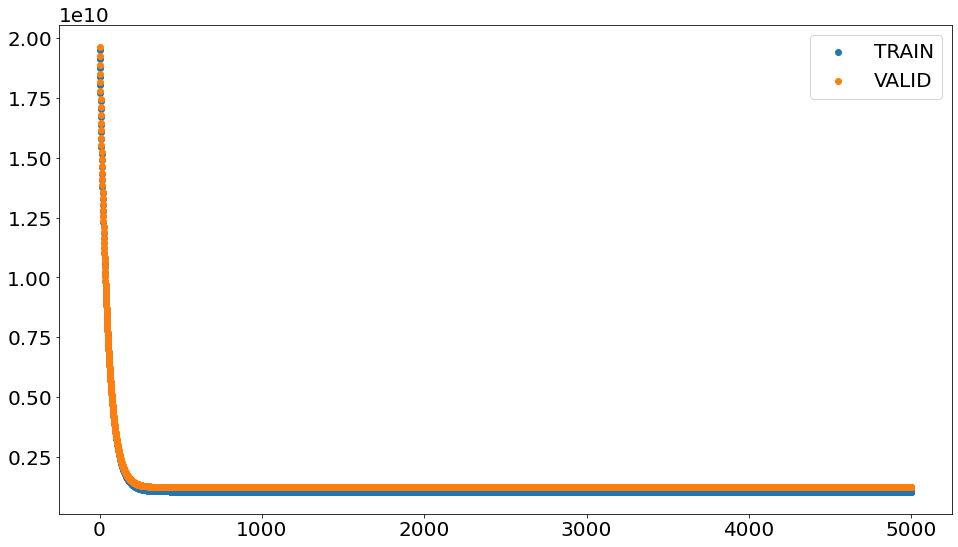

In [72]:
# Plotting the Learning Curve
fig, ax = plt.subplots(figsize=(16,9))

plt.rcParams["font.size"] = 20
plt.scatter(range(len(reg8.loss)), reg8.loss, label="TRAIN")
plt.scatter(range(len(reg8.val_loss)), reg8.val_loss, label="VALID")
plt.legend()
plt.plot()

<li> The predictions are distributed when two features are given and estimated (same as sklearn calculation result).

## Problem 10 (Advance task) Derivation of update formula
The update formula for the steepest descent method was as follows. Explain the process by which this equation is derived.

$\theta_{j}:=\theta_{j}-\alpha \frac{1}{m} \sum_{i=1}^{m}\left[\left(h_{\theta}\left(x^{(i)}\right)-y^{(i)}\right) x_{j}^{(i)}\right]$


To optimize $\theta$, we consider the following equation using the steepest descent descent method. This equation calculates the derivative of the objectives function J with respect to $\theta$ (the slope of J), and updates $\theta$ by the slope x learning rate. 

$\theta_{j}:=\theta_{j}-\frac{\partial}{\partial \theta}_{j} J(\theta)$

Here, $J(\theta)=\frac{1}{2 m} \sum_{i=1}^{m}\left(h_{\theta}\left(x^{(i)}\right)-y^{(i)}\right)^{2}$

$J(\theta)=\frac{1}{2 m} \sum_{i=1}^{m}\left(\theta x^{(i)}-y^{(i)}\right)^{2}=\frac{1}{2 m} \sum_{i=1}^{m}\left(\left(x^{(i)}\theta\right)^{2}-2y^{(i)} x^{(i)}\theta+\left(y^{(i)}\right)^{2}\right)$

From here, we can differentiate with respect to $\theta$

$\Delta \mathrm{J}(\theta) / \Delta \theta$
$=1 / 2 \mathrm{~m} \Sigma\left(2 x^{2}  \theta-2 y x\right)$
$=1 / m \sum x(x \theta-y)$

## Problem 11 (Advance task) Problem of local optimum solution
The steepest descent method generally has the problem of locally optimal solutions. However, with linear regression, you can always find the optimal solution if you continue learning. Please explain it using mathematical formulas and graphs for some reason.

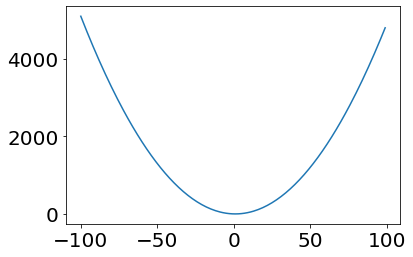

In [73]:
# Predicted value of h(theta) and sample value of J (true value of y is assumed to be 1).
x = np.arange(-100,100,1)
J = 1/2*(x-1)**2

plt.plot(x,J)

As shown in the graph abovem, since the objective function J is a quadratic function that is convex downward, it is possible to find the optimal solution (= gradient 0 by gradient descent method). (If there are peaks and valleys, as in the Mt.Fuji descent problem, the gradient may be zero and minimum locally, but not minumum globally.)